In [1]:
!pip install pyspark
!pip install dask[dataframe]

zsh:1: no matches found: dask[dataframe]


In [2]:
!pip install pyspark

In [3]:
from pyspark.sql import SparkSession

spark = SparkSession.builder \
    .appName("Yelp Restaurant Review") \
    .getOrCreate()

Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
24/10/10 14:38:14 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [5]:

business_csv = 'yelp_academic_dataset_business.csv'

business_df = spark.read.csv(business_csv, header=True, inferSchema=True)

business_df = business_df.withColumnRenamed("stars", "overall_star")


In [7]:
import os

print(os.path.exists(business_csv))

True


In [8]:
business_csv = 'yelp_academic_dataset_business.csv'


if os.path.exists(business_csv):
    try:
        
        business_df = spark.read.csv(business_csv, header=True, inferSchema=True)
    except Exception as e:
        print("Error reading the CSV file:", e)
else:
    print(f"The file {business_csv} does not exist. Please check the path.")

In [9]:
business_df.show(5)

+--------------------+--------------------+--------------------+-------------+-----+-----------+----------+------------+-----+------------+-------+--------------------+--------------------+--------------------+
|         business_id|                name|             address|         city|state|postal_code|  latitude|   longitude|stars|review_count|is_open|          attributes|          categories|               hours|
+--------------------+--------------------+--------------------+-------------+-----+-----------+----------+------------+-----+------------+-------+--------------------+--------------------+--------------------+
|Pns2l4eNsfO8kk83d...|Abby Rappoport, L...|1616 Chapala St, ...|Santa Barbara|   CA|      93101|34.4266787|-119.7111968|  5.0|         7.0|      0|{'ByAppointmentOn...|Doctors, Traditio...|                NULL|
|mpf3x-BjTdTEA3yCZ...|       The UPS Store|87 Grasso Plaza S...|       Affton|   MO|      63123| 38.551126|  -90.335695|  3.0|        15.0|      1|{'Busines

In [11]:
business_df.show(10)

+--------------------+--------------------+--------------------+--------------+-----+-----------+----------+------------+-----+------------+-------+--------------------+--------------------+--------------------+
|         business_id|                name|             address|          city|state|postal_code|  latitude|   longitude|stars|review_count|is_open|          attributes|          categories|               hours|
+--------------------+--------------------+--------------------+--------------+-----+-----------+----------+------------+-----+------------+-------+--------------------+--------------------+--------------------+
|Pns2l4eNsfO8kk83d...|Abby Rappoport, L...|1616 Chapala St, ...| Santa Barbara|   CA|      93101|34.4266787|-119.7111968|  5.0|         7.0|      0|{'ByAppointmentOn...|Doctors, Traditio...|                NULL|
|mpf3x-BjTdTEA3yCZ...|       The UPS Store|87 Grasso Plaza S...|        Affton|   MO|      63123| 38.551126|  -90.335695|  3.0|        15.0|      1|{'Bu

In [ ]:
#merged_df.write.csv('/content/drive/MyDrive/yelp_dataset_csv/merged_yelp_data.csv', header=True)

In [ ]:

business_df.describe().show()

+-------+--------------------+--------------------+------------------+--------------------+------+-----------------+------------------+------------------+------------------+------------------+------------------+--------------------+--------------------+--------------------+
|summary|         business_id|                name|           address|                city| state|      postal_code|          latitude|         longitude|      overall_star|      review_count|           is_open|          attributes|          categories|               hours|
+-------+--------------------+--------------------+------------------+--------------------+------+-----------------+------------------+------------------+------------------+------------------+------------------+--------------------+--------------------+--------------------+
|  count|              150346|              150346|            145219|              150346|150346|           150273|            150346|            150346|            150346|  

Merge CSVs

In [ ]:

df1 = spark.read.csv("yelp_academic_dataset_business.csv", header=True, inferSchema=True)
df2 = spark.read.csv("yelp_academic_dataset_review.csv", header=True, inferSchema=True)

print("Schema of first CSV:")
df1.printSchema()
print("\nSchema of second CSV:")
df2.printSchema()


for col_name in df1.columns:
    if col_name in df2.columns and col_name not in ['business_id']:
        df2 = df2.withColumnRenamed(col_name, col_name + "_2")

merged_df = df1.join(df2, on=["business_id"], how="outer")

merged_df = merged_df.dropna(subset=["review_id"])

print("Available columns after merging:")
print(merged_df.columns)

final_columns = [
    "business_id", "review_id", "name", "address", 
    "stars", "stars_2", "text", "city", 
    "state", "postal_code"
]

valid_columns = [col for col in final_columns if col in merged_df.columns]

print("Final columns selected:")
print(valid_columns)
final_df = merged_df.select(*valid_columns)


final_df.write.csv("merged_output.csv", header=True)

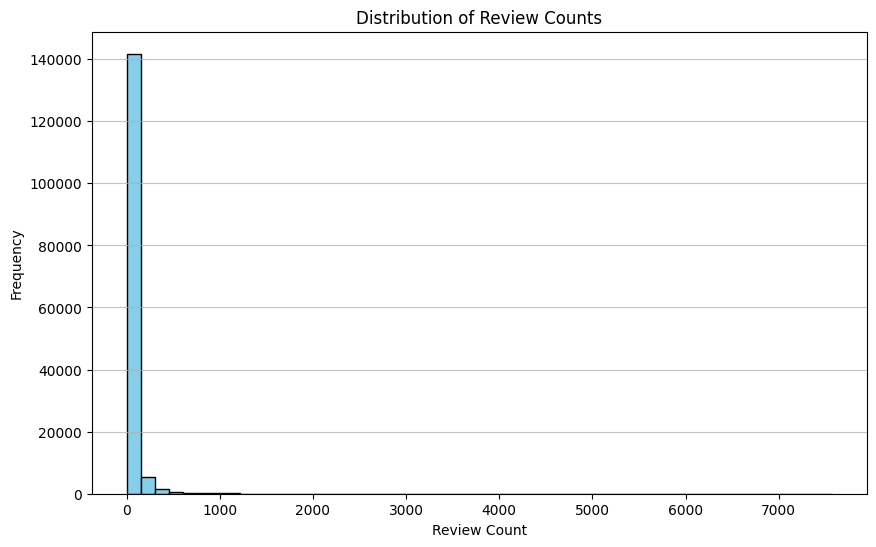

In [ ]:
import matplotlib.pyplot as plt

review_counts = business_df.select("review_count").rdd.flatMap(lambda x: x).collect()


plt.figure(figsize=(10, 6))
plt.hist(review_counts, bins=50, color='skyblue', edgecolor='black')
plt.xlabel('Review Count')
plt.ylabel('Frequency')
plt.title('Distribution of Review Counts')
plt.grid(axis='y', alpha=0.75)
plt.show()

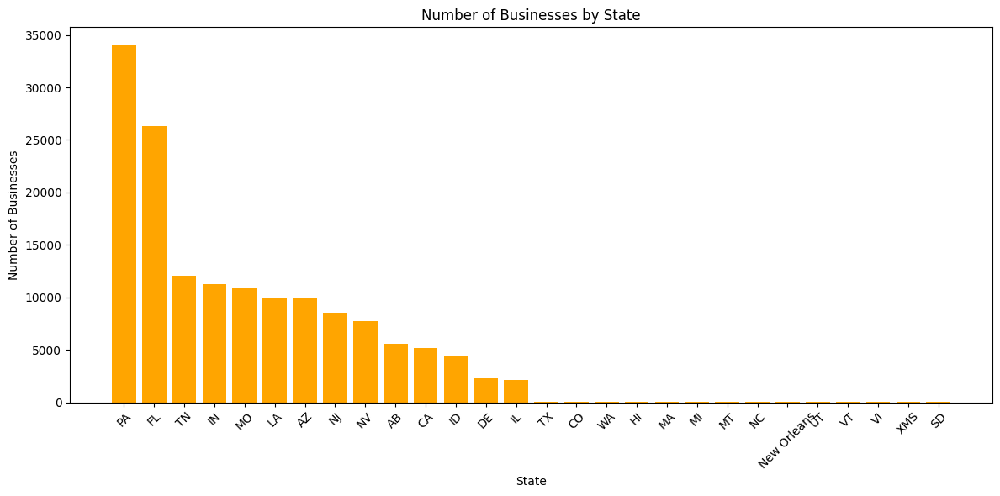

In [ ]:

business_count_by_state = business_df.groupBy("state").count().orderBy("count", ascending=False)


state_counts = business_count_by_state.toPandas()


plt.figure(figsize=(12, 6))
plt.bar(state_counts['state'], state_counts['count'], color='orange')
plt.xlabel('State')
plt.ylabel('Number of Businesses')
plt.title('Number of Businesses by State')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

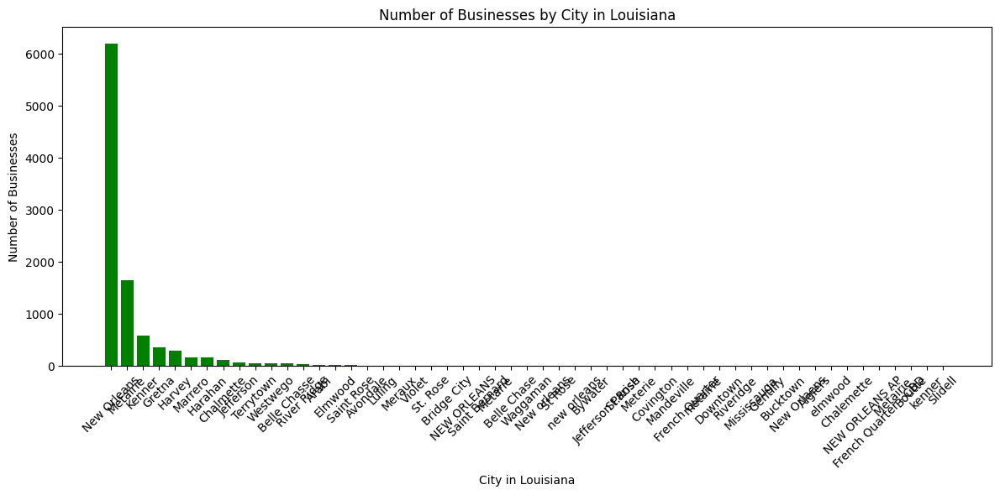

In [15]:
# Filter businesses in Louisiana
la_businesses = business_df.filter(business_df.state == "LA")

business_count_la = la_businesses.groupBy("city", "state").count().orderBy("count", ascending=False)

la_counts = business_count_la.toPandas()

plt.figure(figsize=(12, 6))
plt.bar(la_counts['city'], la_counts['count'], color='green')
plt.xlabel('City in Louisiana')
plt.ylabel('Number of Businesses')
plt.title('Number of Businesses by City in Louisiana')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


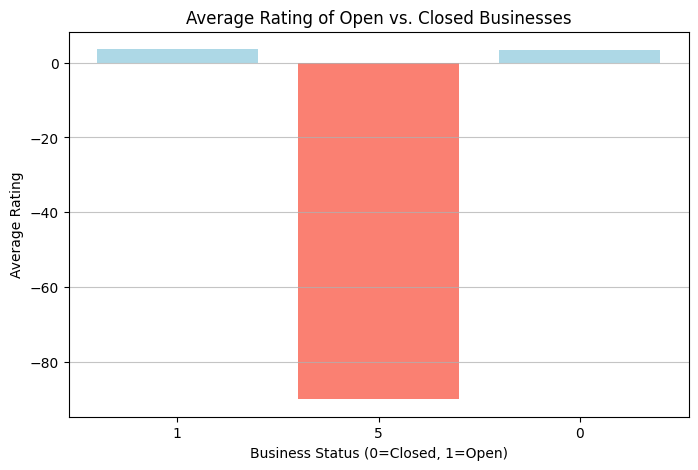

In [ ]:
# Average rating based on whether the business is open or closed
open_closed_rating = business_df.groupBy("is_open").agg({"overall_star": "avg", "business_id": "count"}).withColumnRenamed("count(business_id)", "business_count").toPandas()

plt.figure(figsize=(8, 5))
plt.bar(open_closed_rating['is_open'].astype(str), open_closed_rating['avg(overall_star)'], color=['lightblue', 'salmon'])
plt.xlabel('Business Status (0=Closed, 1=Open)')
plt.ylabel('Average Rating')
plt.title('Average Rating of Open vs. Closed Businesses')
plt.grid(axis='y', alpha=0.75)
plt.show()

In [18]:
# Calculate the average rating by state
average_rating_by_state =business_df.groupBy("state").agg({"stars": "avg"}).withColumnRenamed("avg(stars)", "average_rating").orderBy("average_rating", ascending=False)

top_states = average_rating_by_state.limit(5)
top_states_pd = top_states.toPandas()
top_states_list = top_states_pd['state'].tolist()


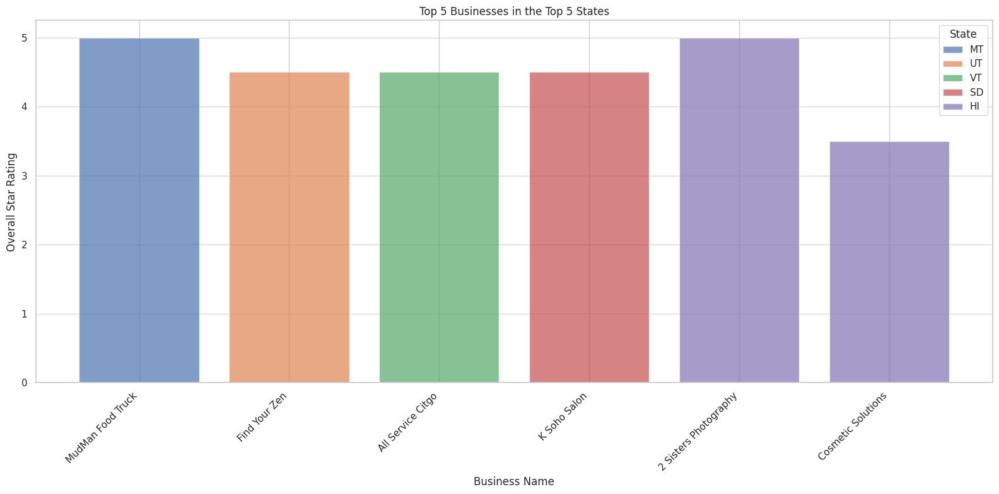

In [ ]:
from pyspark.sql.window import Window
from pyspark.sql.functions import rank
import matplotlib.pyplot as plt
import seaborn as sns

window_spec = Window.partitionBy("state").orderBy(business_df.overall_star.desc())

ranked_businesses_top_states = business_df.filter(business_df.state.isin(top_states_list)).withColumn("rank", rank().over(window_spec))

top_businesses_final = ranked_businesses_top_states.filter(ranked_businesses_top_states.rank <= 5).select("state", "name", "overall_star")
top_businesses_final_pd = top_businesses_final.toPandas()

sns.set(style="whitegrid")

palette = sns.color_palette("husl", len(top_states_list))

plt.figure(figsize=(16, 8))


for state in top_states_list:
    state_data = top_businesses_final_pd[top_businesses_final_pd['state'] == state]
    plt.bar(state_data['name'], state_data['overall_star'], label=state, alpha=0.7)

plt.xlabel('Business Name')
plt.ylabel('Overall Star Rating')
plt.title('Top 5 Businesses in the Top 5 States')
plt.xticks(rotation=45, ha='right')
plt.legend(title='State')
plt.grid(axis='y', alpha=0.75)
plt.tight_layout()
plt.show()


In [ ]:
import dask.dataframe as dd
df = business_df.toPandas()
df_dask = dd.from_pandas(df, npartitions=4)

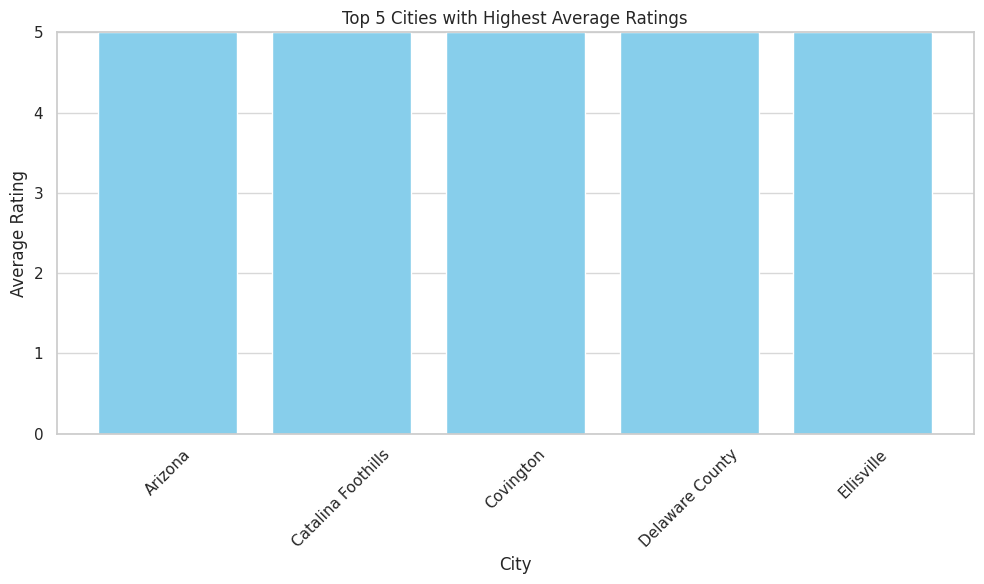

In [ ]:

average_rating_by_city = df_dask.groupby('city')['overall_star'].mean().nlargest(5).compute()
average_rating_by_city_pd = average_rating_by_city.reset_index()
average_rating_by_city_pd.columns = ['city', 'average_rating']

import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
plt.bar(average_rating_by_city_pd['city'], average_rating_by_city_pd['average_rating'], color='skyblue')
plt.xlabel('City')
plt.ylabel('Average Rating')
plt.title('Top 5 Cities with Highest Average Ratings')
plt.xticks(rotation=45)
plt.ylim(0, 5) 
plt.grid(axis='y', alpha=0.75)
plt.tight_layout()
plt.show()

In [ ]:
!pip install datasets

INFO: pip is looking at multiple versions of multiprocess to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 471.6/471.6 kB 15.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 10.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 17.4 MB/s eta 0:00:00


In [3]:
# import dask.dataframe as dd
# import csv
# # Assuming the data is in a CSV file
# dask_df = dd.read_csv('/content/drive/MyDrive/yelp_dataset_csv/yelp_academic_dataset_review.csv', on_bad_lines='skip', lineterminator='\n', quoting=csv.QUOTE_NONE, low_memory=False)  # Adjust the path as needed

In [14]:
import dask.dataframe as dd
import csv

dask_df = dd.read_csv(
    'yelp_academic_dataset_review.csv', 
    on_bad_lines='skip', 
    lineterminator='\n', 
    quoting=csv.QUOTE_NONE, 
    low_memory=False
)

print(dask_df.head())


                                                                                            review_id  \
KU_O5udG6zpxOg-VcAEodg                                                         mh_-eMZ6K5RLWhZyISBhwA   
The food is good                                     but it takes a very long time to come out. Th...   
For anyone who struggles to fit workouts in          the online scheduling system makes it easy to...   
There is no way I can write this review without...                            the owner of Body Cycle   
JrIxlS1TzJ-iCu79ul40cQ                                                         eUta8W_HdHMXPzLBBZhL1A   

                                                                                              user_id  \
KU_O5udG6zpxOg-VcAEodg                                                         XQfwVwDr-v0ZS3_CbbE5Xw   
The food is good                                     but usually pleasant. We have just had too ma...   
For anyone who struggles to fit workouts in           

In [15]:
cleaned_df = dask_df.compute()

In [4]:
import dask.dataframe as dd
import re
import numpy as np
import torch
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from transformers import BertTokenizer, BertForSequenceClassification, Trainer, TrainingArguments

/Users/nushrat/Library/CloudStorage/OneDrive-LouisianaStateUniversity/LSU Class/Fall 24/Big Data/project/venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Logistic Regression

In [8]:
!pip install scikit-learn

Logistic Regression Classifier

Validation Accuracy: 0.7909
Test Accuracy: 0.7906
              precision    recall  f1-score   support

    Negative       0.80      0.84      0.82    221791
     Neutral       0.47      0.09      0.15     33848
    Positive       0.79      0.85      0.82    213430

    accuracy                           0.79    469069
   macro avg       0.69      0.59      0.60    469069
weighted avg       0.77      0.79      0.77    469069



<Figure size 800x600 with 0 Axes>

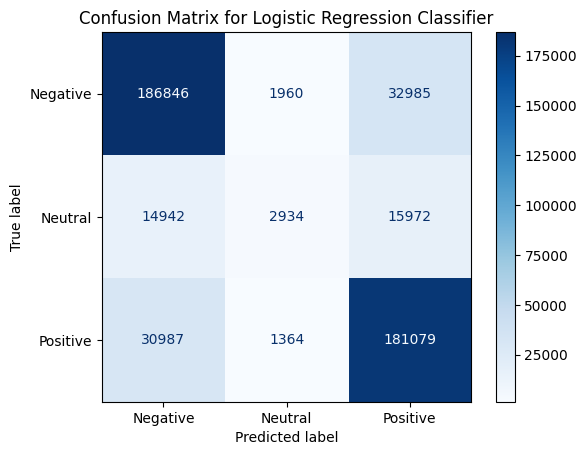

In [18]:
import dask.dataframe as dd
import pandas as pd
import numpy as np
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

cleaned_df['stars'] = pd.to_numeric(cleaned_df['stars'], errors='coerce')

# Define a function to clean the text
def preprocess_text(text):
    if isinstance(text, str):
        text = text.lower() 
        text = re.sub(r'[^a-zA-Z0-9\s]', '', text)  # Remove special characters
        return text
    return ''  # Return empty string for NaN values

# Apply the preprocessing function
cleaned_df['clean_text'] = cleaned_df['text'].apply(preprocess_text)

cleaned_df = cleaned_df.dropna(subset=['stars'])

# ratings to classes
def map_stars_to_classes(stars):
    if stars >= 4:
        return 2  # Positive
    elif stars == 3:
        return 1  # Neutral
    else:
        return 0  # Negative

# create labels
cleaned_df['labels'] = cleaned_df['stars'].apply(map_stars_to_classes)


cleaned_df = cleaned_df.dropna(subset=['labels'])


train_df, temp_df = train_test_split(cleaned_df, test_size=0.3, stratify=cleaned_df['labels'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['labels'], random_state=42)

# Use TF-IDF to vectorize the text
vectorizer = TfidfVectorizer(max_features=5000)
X_train = vectorizer.fit_transform(train_df['clean_text'])
X_val = vectorizer.transform(val_df['clean_text'])
X_test = vectorizer.transform(test_df['clean_text'])

y_train = train_df['labels']
y_val = val_df['labels']
y_test = test_df['labels']




# Train Logistic Regression model
clf = LogisticRegression(max_iter=1000, random_state=42)
clf.fit(X_train, y_train)

# Evaluation
val_predictions = clf.predict(X_val)
val_accuracy = accuracy_score(y_val, val_predictions)
print(f'Validation Accuracy: {val_accuracy:.4f}')

# Evaluation on test
test_predictions = clf.predict(X_test)
test_accuracy = accuracy_score(y_test, test_predictions)
print(f'Test Accuracy: {test_accuracy:.4f}')

# classification report
report = classification_report(y_test, test_predictions, target_names=['Negative', 'Neutral', 'Positive'])
print(report)


# LR confusion matrix
def plot_confusion_matrix(y_true, y_pred, model_name):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Negative', 'Neutral', 'Positive'])
    
    plt.figure(figsize=(8, 6))
    disp.plot(cmap=plt.cm.Blues, values_format='d')
    plt.title(f'Confusion Matrix for {model_name}')
    plt.show()


plot_confusion_matrix(y_test, test_predictions, "Logistic Regression Classifier")

SGD Classifier

SGDClassifier Validation Accuracy: 0.7817
SGDClassifier Test Accuracy: 0.7804
              precision    recall  f1-score   support

    Negative       0.79      0.84      0.81    221791
     Neutral       0.47      0.00      0.00     33848
    Positive       0.77      0.85      0.81    213430

    accuracy                           0.78    469069
   macro avg       0.68      0.56      0.54    469069
weighted avg       0.76      0.78      0.75    469069



<Figure size 800x600 with 0 Axes>

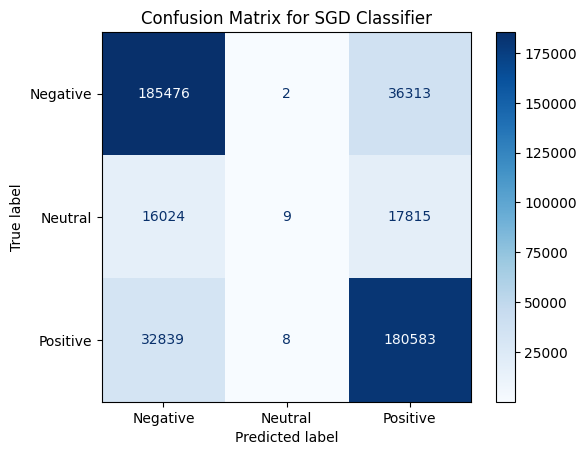

In [14]:
import dask.dataframe as dd
import pandas as pd
import numpy as np
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report


cleaned_df['stars'] = pd.to_numeric(cleaned_df['stars'], errors='coerce')

# Define a function to clean the text
def preprocess_text(text):
    if isinstance(text, str):
        text = text.lower()  # Lowercase
        text = re.sub(r'[^a-zA-Z0-9\s]', '', text) 
        return text
    return ''


cleaned_df['clean_text'] = cleaned_df['text'].apply(preprocess_text)


cleaned_df = cleaned_df.dropna(subset=['stars'])

# Map star ratings to classes
def map_stars_to_classes(stars):
    if stars >= 4:
        return 2  # Positive
    elif stars == 3:
        return 1  # Neutral
    else:
        return 0  # Negative


cleaned_df['labels'] = cleaned_df['stars'].apply(map_stars_to_classes)


cleaned_df = cleaned_df.dropna(subset=['labels'])

# Split data into training, validation and test sets
train_df, temp_df = train_test_split(cleaned_df, test_size=0.3, stratify=cleaned_df['labels'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['labels'], random_state=42)

# Using TF-IDF
vectorizer = TfidfVectorizer(max_features=5000)  # Limit to top 5000 words by frequency
X_train = vectorizer.fit_transform(train_df['clean_text'])
X_val = vectorizer.transform(val_df['clean_text'])
X_test = vectorizer.transform(test_df['clean_text'])

y_train = train_df['labels']
y_val = val_df['labels']
y_test = test_df['labels']




# Train SGDClassifier model
sgd_clf = SGDClassifier(max_iter=1000, random_state=42)
sgd_clf.fit(X_train, y_train)

# Evaluation on validation set
val_predictions = sgd_clf.predict(X_val)
val_accuracy = accuracy_score(y_val, val_predictions)
print(f'SGDClassifier Validation Accuracy: {val_accuracy:.4f}')

# Evaluation on test set
test_predictions = sgd_clf.predict(X_test)
test_accuracy = accuracy_score(y_test, test_predictions)
print(f'SGDClassifier Test Accuracy: {test_accuracy:.4f}')

# classification
report = classification_report(y_test, test_predictions, target_names=['Negative', 'Neutral', 'Positive'])
print(report)

# SGD confusion matrix
def plot_confusion_matrix(y_true, y_pred, model_name):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Negative', 'Neutral', 'Positive'])
    
    plt.figure(figsize=(8, 6))
    disp.plot(cmap=plt.cm.Blues, values_format='d')
    plt.title(f'Confusion Matrix for {model_name}')
    plt.show()


plot_confusion_matrix(y_test, test_predictions, "SGD Classifier")

Gradient Boosting Classifier

Gradient Boosting Classifier Validation Accuracy: 0.7437
Gradient Boosting Classifier Test Accuracy: 0.7422
              precision    recall  f1-score   support

    Negative       0.74      0.81      0.78    221791
     Neutral       0.50      0.04      0.07     33848
    Positive       0.74      0.78      0.76    213430

    accuracy                           0.74    469069
   macro avg       0.66      0.54      0.54    469069
weighted avg       0.73      0.74      0.72    469069



<Figure size 800x600 with 0 Axes>

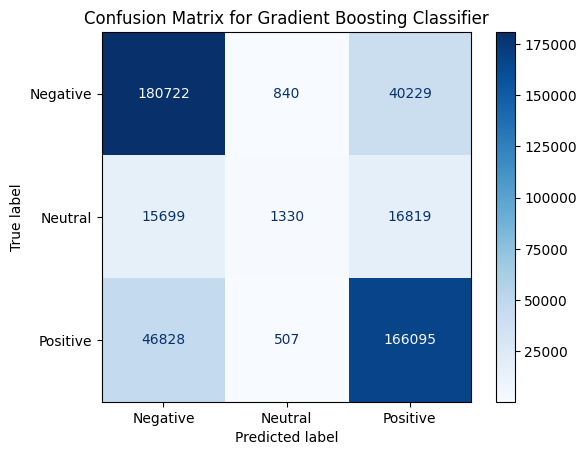

In [16]:
import dask.dataframe as dd
import pandas as pd
import numpy as np
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt


cleaned_df['stars'] = pd.to_numeric(cleaned_df['stars'], errors='coerce')


def preprocess_text(text):
    if isinstance(text, str):
        text = text.lower()  
        text = re.sub(r'[^a-zA-Z0-9\s]', '', text)
        return text
    return '' 


cleaned_df['clean_text'] = cleaned_df['text'].apply(preprocess_text)


cleaned_df = cleaned_df.dropna(subset=['stars'])


def map_stars_to_classes(stars):
    if stars >= 4:
        return 2  # Positive
    elif stars == 3:
        return 1  # Neutral
    else:
        return 0  # Negative


cleaned_df['labels'] = cleaned_df['stars'].apply(map_stars_to_classes)


cleaned_df = cleaned_df.dropna(subset=['labels'])


train_df, temp_df = train_test_split(cleaned_df, test_size=0.3, stratify=cleaned_df['labels'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['labels'], random_state=42)

# Using TF-IDF
vectorizer = TfidfVectorizer(max_features=5000)  # Limit to top 5000 words by frequency
X_train = vectorizer.fit_transform(train_df['clean_text'])
X_val = vectorizer.transform(val_df['clean_text'])
X_test = vectorizer.transform(test_df['clean_text'])

y_train = train_df['labels']
y_val = val_df['labels']
y_test = test_df['labels']

# Train Gradient Boosting Classifier model
gb_clf = GradientBoostingClassifier(n_estimators=100, random_state=42)
gb_clf.fit(X_train, y_train)

# Evaluation on validation set
val_predictions = gb_clf.predict(X_val)
val_accuracy = accuracy_score(y_val, val_predictions)
print(f'Gradient Boosting Classifier Validation Accuracy: {val_accuracy:.4f}')

# Evaluation on test set
test_predictions = gb_clf.predict(X_test)
test_accuracy = accuracy_score(y_test, test_predictions)
print(f'Gradient Boosting Classifier Test Accuracy: {test_accuracy:.4f}')

#classification report
report = classification_report(y_test, test_predictions, target_names=['Negative', 'Neutral', 'Positive'])
print(report)

# Gradient Boosting confusion matrix
def plot_confusion_matrix(y_true, y_pred, model_name):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Negative', 'Neutral', 'Positive'])
    
    plt.figure(figsize=(8, 6))
    disp.plot(cmap=plt.cm.Blues, values_format='d')
    plt.title(f'Confusion Matrix for {model_name}')
    plt.show()

plot_confusion_matrix(y_test, test_predictions, "Gradient Boosting Classifier")


Random Forest Classifier

Random Forest Classifier Validation Accuracy: 0.7886
Random Forest Classifier Test Accuracy: 0.7879
              precision    recall  f1-score   support

    Negative       0.84      0.80      0.82    221791
     Neutral       0.42      0.02      0.04     33848
    Positive       0.75      0.90      0.82    213430

    accuracy                           0.79    469069
   macro avg       0.67      0.57      0.56    469069
weighted avg       0.77      0.79      0.76    469069



<Figure size 800x600 with 0 Axes>

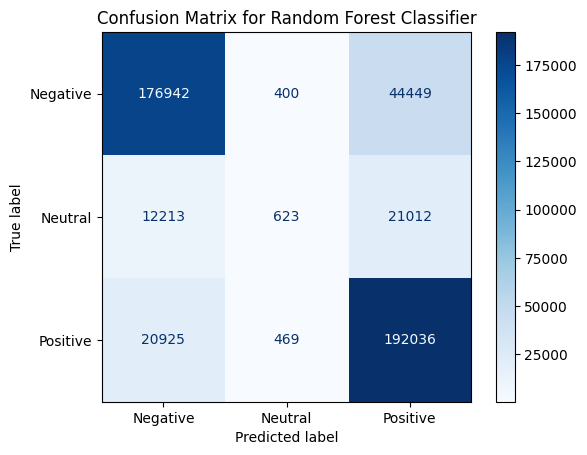

In [6]:
import dask.dataframe as dd
import pandas as pd
import numpy as np
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt


cleaned_df['stars'] = pd.to_numeric(cleaned_df['stars'], errors='coerce')


def preprocess_text(text):
    if isinstance(text, str):
        text = text.lower() 
        text = re.sub(r'[^a-zA-Z0-9\s]', '', text)
        return text
    return ''


cleaned_df['clean_text'] = cleaned_df['text'].apply(preprocess_text)


cleaned_df = cleaned_df.dropna(subset=['stars'])

# Map star ratings to classes
def map_stars_to_classes(stars):
    if stars >= 4:
        return 2  # Positive
    elif stars == 3:
        return 1  # Neutral
    else:
        return 0  # Negative


cleaned_df['labels'] = cleaned_df['stars'].apply(map_stars_to_classes)


cleaned_df = cleaned_df.dropna(subset=['labels'])


train_df, temp_df = train_test_split(cleaned_df, test_size=0.3, stratify=cleaned_df['labels'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['labels'], random_state=42)

# Using TF-IDF
vectorizer = TfidfVectorizer(max_features=5000)  # Limit to top 5000 words by frequency
X_train = vectorizer.fit_transform(train_df['clean_text'])
X_val = vectorizer.transform(val_df['clean_text'])
X_test = vectorizer.transform(test_df['clean_text'])

y_train = train_df['labels']
y_val = val_df['labels']
y_test = test_df['labels']

# Train RF Classifier model
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf.fit(X_train, y_train)

# Evaluation on validation set
val_predictions = rf_clf.predict(X_val)
val_accuracy = accuracy_score(y_val, val_predictions)
print(f'Random Forest Classifier Validation Accuracy: {val_accuracy:.4f}')

# Evaluation on test set
test_predictions = rf_clf.predict(X_test)
test_accuracy = accuracy_score(y_test, test_predictions)
print(f'Random Forest Classifier Test Accuracy: {test_accuracy:.4f}')

# classification report
report = classification_report(y_test, test_predictions, target_names=['Negative', 'Neutral', 'Positive'])
print(report)

# Random Forest confusion matrix
def plot_confusion_matrix(y_true, y_pred, model_name):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Negative', 'Neutral', 'Positive'])
    
    plt.figure(figsize=(8, 6))
    disp.plot(cmap=plt.cm.Blues, values_format='d')
    plt.title(f'Confusion Matrix for {model_name}')
    plt.show()

plot_confusion_matrix(y_test, test_predictions, "Random Forest Classifier")


##Models comparison Visualisation

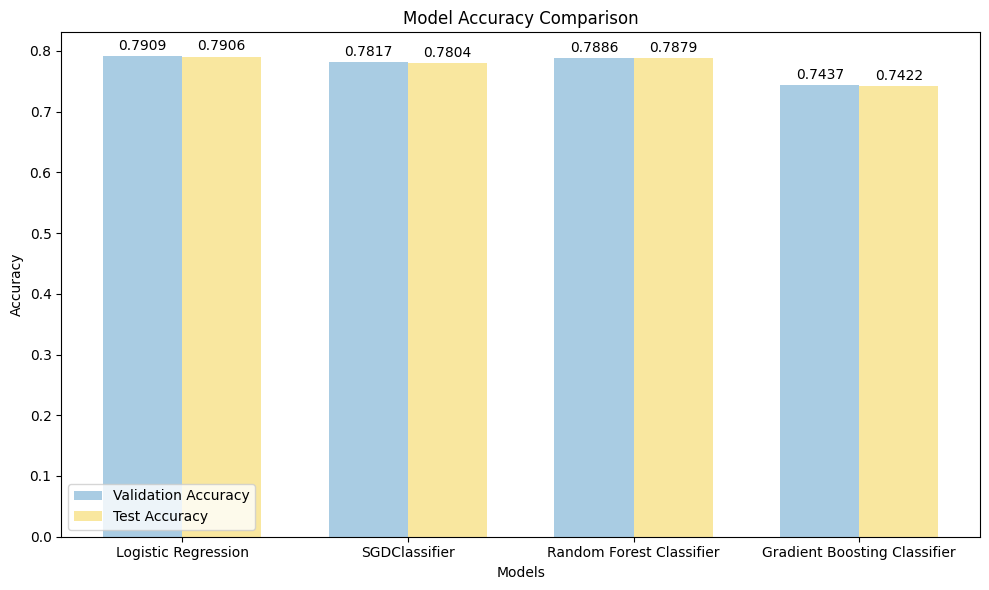

In [20]:
#visualization without big data framework

import matplotlib.pyplot as plt
import numpy as np

# Data Preparation
models = [
    "Logistic Regression",
    "SGDClassifier",
    "Random Forest Classifier",
    "Gradient Boosting Classifier"
]

validation_accuracies = [0.7909, 0.7817, 0.7886, 0.7437]
test_accuracies = [0.7906, 0.7804, 0.7879, 0.7422]

# Bar positions
x = np.arange(len(models))

# Plotting setup
fig, ax = plt.subplots(figsize=(10, 6))

# Pastel colors for the bars
pastel_colors = ['#A9CCE3', '#F9E79F']  # Light blue and light yellow

# Plotting bars
bar_width = 0.35
bars1 = ax.bar(x - bar_width/2, validation_accuracies, bar_width, label='Validation Accuracy', color=pastel_colors[0])
bars2 = ax.bar(x + bar_width/2, test_accuracies, bar_width, label='Test Accuracy', color=pastel_colors[1])

# Adding labels and title
ax.set_xlabel('Models')
ax.set_ylabel('Accuracy')
ax.set_title('Model Accuracy Comparison')
ax.set_xticks(x)
ax.set_xticklabels(models)
ax.legend()

# Function to add value labels to the bars
def add_value_labels(bars):
    for bar in bars:
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, yval + 0.005, round(yval, 4), ha='center', va='bottom')

# Add labels for both sets of bars
add_value_labels(bars1)
add_value_labels(bars2)

# Display the plot
plt.tight_layout()
plt.show()



24/10/11 12:24:17 WARN Utils: Service 'SparkUI' could not bind on port 4040. Attempting port 4041.


+--------------------+-------------------+-------------+
|               Model|Validation Accuracy|Test Accuracy|
+--------------------+-------------------+-------------+
| Logistic Regression|             0.7909|       0.7906|
|       SGDClassifier|             0.7817|       0.7804|
|Random Forest Cla...|             0.7886|       0.7879|
|Gradient Boosting...|             0.7437|       0.7422|
+--------------------+-------------------+-------------+



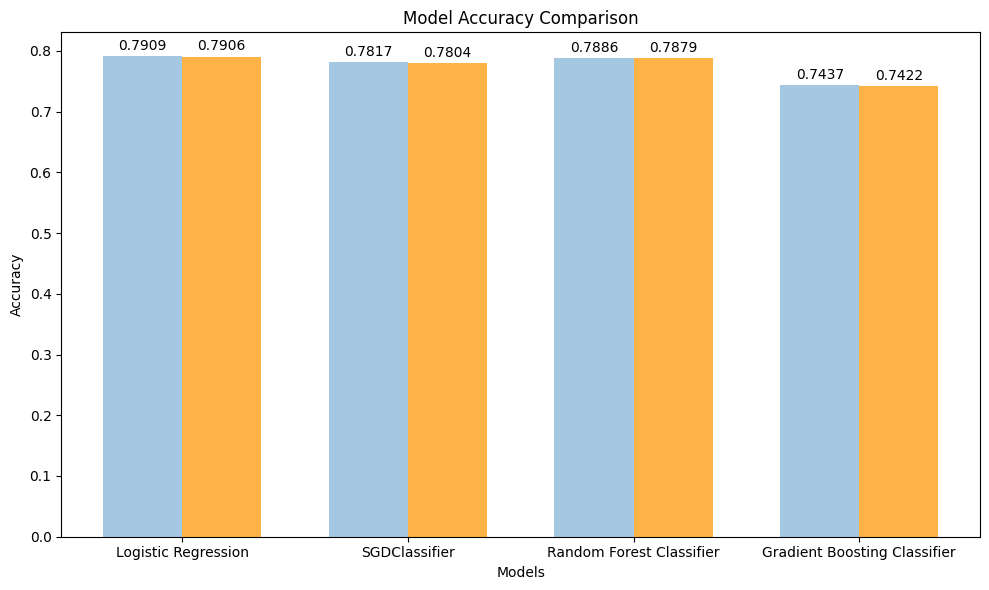

In [26]:
#visualization with big data framework

from pyspark.sql import SparkSession
import matplotlib.pyplot as plt
import pandas as pd

# Initialize Spark session
spark = SparkSession.builder \
    .appName("Model Accuracy Visualization") \
    .getOrCreate()

# Data Preparation (including Gradient Boosting Classifier)
data = [
    ("Logistic Regression", 0.7909, 0.7906),
    ("SGDClassifier", 0.7817, 0.7804),
    ("Random Forest Classifier", 0.7886, 0.7879),
    ("Gradient Boosting Classifier", 0.7437, 0.7422)  # Adding Gradient Boosting Classifier
]

# Define columns and create DataFrame
columns = ["Model", "Validation Accuracy", "Test Accuracy"]
df = spark.createDataFrame(data, columns)

# Show the DataFrame in Spark
df.show()

# Convert Spark DataFrame to Pandas DataFrame for visualization
pdf = df.toPandas()

# Extract model names and accuracies
models = pdf["Model"]
validation_accuracies = pdf["Validation Accuracy"]
test_accuracies = pdf["Test Accuracy"]

# Set up positions for the bars
x = range(len(models))

# Create plot
fig, ax = plt.subplots(figsize=(10, 6))

# Define pastel colors (pastel pink and teal pastel)
pastel_colors = ['#A4C8E1', '#FFB347']  # Pastel pink and teal pastel

# Plot the bars
bar_width = 0.35
bars1 = ax.bar([i - bar_width / 2 for i in x], validation_accuracies, bar_width, label='Validation Accuracy', color=pastel_colors[0])
bars2 = ax.bar([i + bar_width / 2 for i in x], test_accuracies, bar_width, label='Test Accuracy', color=pastel_colors[1])

# Add labels, title, and ticks
ax.set_xlabel('Models')
ax.set_ylabel('Accuracy')
ax.set_title('Model Accuracy Comparison')
ax.set_xticks(x)
ax.set_xticklabels(models)

# Function to add value labels above bars
def add_value_labels(bars):
    for bar in bars:
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, yval + 0.005, round(yval, 4), ha='center', va='bottom')

# Add value labels to both sets of bars
add_value_labels(bars1)
add_value_labels(bars2)

# Adjust layout and show plot
plt.tight_layout()
plt.show()

# Stop the Spark session
spark.stop()


## Word Cloud

In [6]:
!pip install wordcloud matplotlib pandas

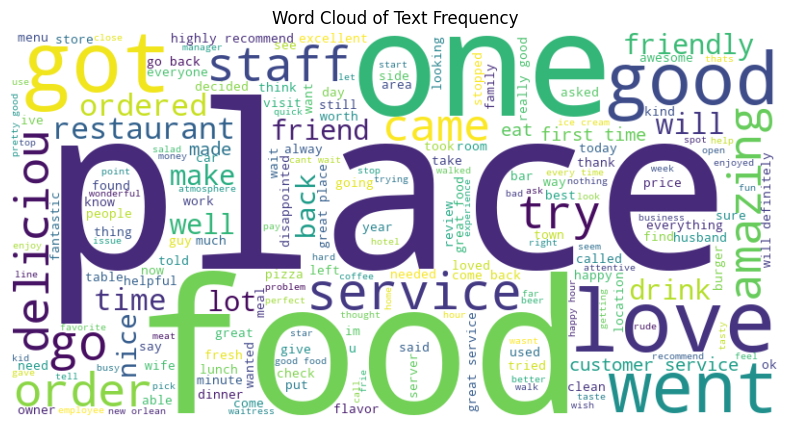

In [4]:
import dask.dataframe as dd
import pandas as pd
import numpy as np
import re
from wordcloud import WordCloud
import matplotlib.pyplot as plt

dask_df = dd.read_csv(
    'yelp_academic_dataset_review.csv', 
    on_bad_lines='skip', 
    lineterminator='\n', 
    quoting=csv.QUOTE_NONE, 
    low_memory=False
)
cleaned_df = dask_df.compute()


def preprocess_text(text):
    if isinstance(text, str):
        text = text.lower()
        text = re.sub(r'[^a-zA-Z0-9\s]', '', text)  
        return text
    return ''  


cleaned_df['clean_text'] = cleaned_df['text'].apply(preprocess_text)


all_text = ' '.join(cleaned_df['clean_text'].tolist())

# Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white', max_words=200).generate(all_text)

# showing the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off') 
plt.title('Word Cloud of Text Frequency')
plt.show()


In [19]:
#paths to the CSV files
merged_csv = 'merged_output.csv'

# Load the CSV
merged_df = spark.read.csv(merged_csv, header=True, inferSchema=True)

In [20]:
import os

print(os.path.exists(merged_csv))
merged_csv = 'merged_output.csv'


if os.path.exists(merged_csv):
    try:
        
        merged_df = spark.read.csv(merged_csv, header=True, inferSchema=True)
    except Exception as e:
        print("Error reading the CSV file:", e)
else:
    print(f"The file {merged_csv} does not exist. Please check the path.")

True


In [21]:
merged_df.show(10)

+--------------------+--------------------+--------------------+-------------+-----+-----------+----------+------------+-------+------------+-------+--------------------+--------------------+-----+--------------------+--------------------+-------+------+-----+----+--------------------+-------------------+
|         business_id|                name|             address|         city|state|postal_code|  latitude|   longitude|stars_x|review_count|is_open|          attributes|          categories|hours|           review_id|             user_id|stars_y|useful|funny|cool|                text|               date|
+--------------------+--------------------+--------------------+-------------+-----+-----------+----------+------------+-------+------------+-------+--------------------+--------------------+-----+--------------------+--------------------+-------+------+-----+----+--------------------+-------------------+
|Pns2l4eNsfO8kk83d...|Abby Rappoport, L...|1616 Chapala St, ...|Santa Barbara| 

In [22]:
!pip install cassandra-driver pandas


In [ ]:
#cassandra -f #running locally on terminal


##Cassandra-driver for query

In [28]:
# Load CSV 
data = pd.read_csv('merged_output.csv')


In [29]:
import os

# current directory
print("Current Working Directory:", os.getcwd())

Current Working Directory: /Users/nushrat/Library/CloudStorage/OneDrive-LouisianaStateUniversity/LSU Class/Fall 24/Big Data/project


In [34]:
pip install cassandra-driver


Note: you may need to restart the kernel to use updated packages.


In [37]:
from cassandra.cluster import Cluster

# Connect to the Cassandra cluster running in Docker
cluster = Cluster(['0.0.0.0'], port=9042)
session = cluster.connect('business_data')


In [38]:
# Simple Query - Reading Data from 'reviews' table where stars_y = 5.0 and state = 'LA'
print("Reading data simply...")
rows = session.execute("SELECT * FROM reviews WHERE stars_y = 5.0 AND state = 'LA' ALLOW FILTERING;")
for review_row in rows:
    print(f"{review_row.name} | {review_row.stars_y} stars | {review_row.state} | {review_row.city}")
    print(f"Review: {review_row.text}")

Reading data simply...
Eagle Plumbing Repairs & Drain Cleaning | 5.0 stars | LA | Kenner
Review: At first i had an issue with the plumber and service, the manager called me back and was completely professional and courteous.  Manager sent out a new technician and helper. My problem was solved in about 20 minutes to my complete satisfaction!  I highly recommend Eagle Plumbing for their professionalism, courtesy, and dedication to customer satisfaction!
Eagle Plumbing Repairs & Drain Cleaning | 5.0 stars | LA | Kenner
Review: Showed up on time. Pleasant and efficient. Took care of my shower plumbing issue and even adjusted the rain head in master bath!  Eagle Plumbing is definitely on my go-to list and should be on yours too!
Eagle Plumbing Repairs & Drain Cleaning | 5.0 stars | LA | Kenner
Review: Great Service came on a Sunday 12/31/17. Donald found the leak and fixed it! I was treading water and had four guests in my home. I was frantic. Price was reasonable and he came the same day I

In [40]:
# Prepared Statement Query - Optimized way to fetch specific data
print("Reading data using prepared statements...")
prepared_statement = session.prepare("SELECT * FROM reviews WHERE business_id=?")
business_ids_to_lookup = ['bEeZg3fNNRCqg1v5DiSvXA']

for business_id in business_ids_to_lookup:
    review = session.execute(prepared_statement, [business_id]).one()
    if review:
        print(f"Business Name: {review.name}, City: {review.city}, Stars: {review.stars_y}")
    else:
        print(f"No review found for business_id: {business_id}")

Reading data using prepared statements...
Business Name: Eagle Plumbing Repairs & Drain Cleaning, City: Kenner, Stars: 1.0


In [42]:
# Inserting Data into the 'reviews' table
print("Inserting new review data...")
session.execute("""
    INSERT INTO reviews (
        business_id, name, address, city, state, postal_code, 
        latitude, longitude, stars_x, review_count, is_open, 
        attributes, categories, hours, review_id, user_id, 
        stars_y, useful, funny, cool, text, date
    ) VALUES (
        'new_business_id', 
        'New Business', 
        '123 Main St', 
        'Los Angeles', 
        'CA', 
        '90001', 
        34.05, 
        -118.25, 
        4.5, 
        10, 
        1, 
        'Some attributes', 
        'Some categories', 
        'Some hours', 
        'new_review_id',  -- Make sure this is unique for each review
        'user_id_123',    -- Replace with a valid user_id
        5.0, 
        1, 
        0, 
        0, 
        'Great place to visit!', 
        '2024-10-11 12:00:00'  -- Use the correct format for timestamps
    );
""")

# Example of an asynchronous insert with review_id
future = session.execute_async("""
    INSERT INTO reviews (
        business_id, name, address, city, state, postal_code, 
        latitude, longitude, stars_x, review_count, is_open, 
        attributes, categories, hours, review_id, user_id, 
        stars_y, useful, funny, cool, text, date
    ) VALUES (
        'async_business_id', 
        'Async Business', 
        '456 Sunset Blvd', 
        'Los Angeles', 
        'CA', 
        '90001', 
        34.06, 
        -118.26, 
        3.5, 
        5, 
        1, 
        'Some attributes', 
        'Some categories', 
        'Some hours', 
        'async_review_id',  -- Make sure this is unique for each review
        'user_id_456',      -- Replace with a valid user_id
        4.0, 
        0, 
        0, 
        1, 
        'Nice atmosphere!', 
        '2024-10-11 12:30:00'  -- Use the correct format for timestamps
    );
""")
future.result() 
print("Asynchronous data insert completed.")


Inserting new review data...
Asynchronous data insert completed.


In [43]:
prepared_statement = session.prepare("SELECT * FROM reviews WHERE business_id=?")
business_ids_to_lookup = ['new_business_id']

for business_id in business_ids_to_lookup:
    review = session.execute(prepared_statement, [business_id]).one()
    if review:
        print(f"Business Name: {review.name}, City: {review.city}, Stars: {review.stars_y}")
    else:
        print(f"No review found for business_id: {business_id}")

Business Name: New Business, City: Los Angeles, Stars: 5.0


##Lines of code here

In [2]:
import json

def count_code_lines_in_ipynb(file_path):
    try:
        with open(file_path, 'r', encoding='utf-8') as f:
            notebook_data = json.load(f)
    
        line_count = 0
    
        for cell in notebook_data['cells']:
            if cell['cell_type'] == 'code':
                line_count += len(cell['source'])
        
        return line_count
    
    except Exception as e:
        print(f"An error occurred: {e}")
        return None


if __name__ == "__main__":
    ipynb_file = 'project_BD_final.ipynb'
    total_lines = count_code_lines_in_ipynb(ipynb_file)
    if total_lines is not None:
        print(f"Total lines of code in {ipynb_file}: {total_lines}")

Total lines of code in project_BD_final.ipynb: 856
